In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df=pd.read_csv("train.csv")

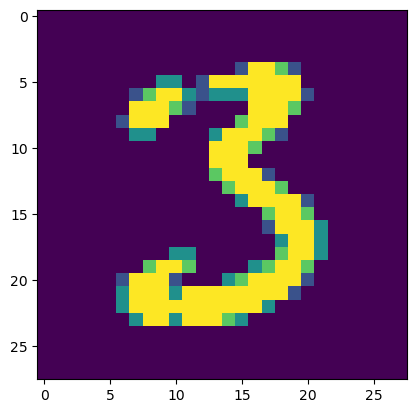

In [3]:
plt.imshow(df.iloc[39098,1:].values.reshape(28,28))

In [4]:
x=df.iloc[:,1:]
y=df.iloc[:,0]

In [5]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

In [6]:
from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier()

In [7]:
knn.fit(x_train,y_train)

KNeighborsClassifier()

In [8]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

In [9]:
x_train=scaler.fit_transform(x_train)
x_test=scaler.transform(x_test)

0.3236904761904762


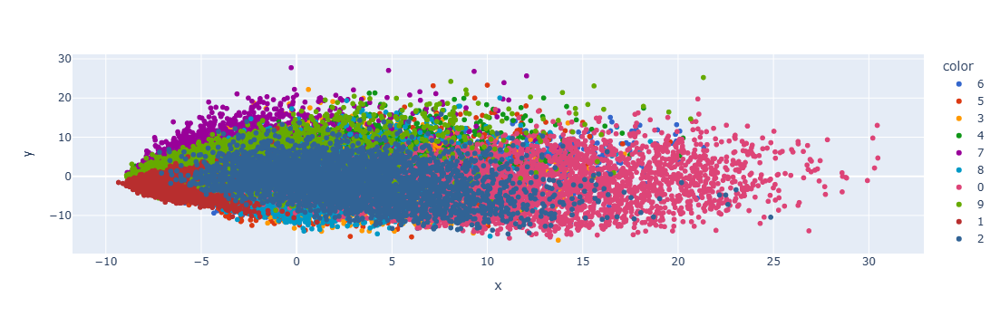

In [10]:
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score
pca=PCA(n_components=2) #number of principal components
x_train_trf=pca.fit_transform(x_train)
x_test_trf=pca.transform(x_test)
    
knn=KNeighborsClassifier()
knn.fit(x_train_trf,y_train)
    
y_pred=knn.predict(x_test_trf)
print(accuracy_score(y_pred,y_test))

#2d visualization by plotly
import plotly.express as px
y_train_trf=y_train.astype(str)
fig= px.scatter(x=x_train_trf[:,0],y=x_train_trf[:,1],color=y_train_trf,color_discrete_sequence=px.colors.qualitative.G10)
fig.show()

0.5104761904761905


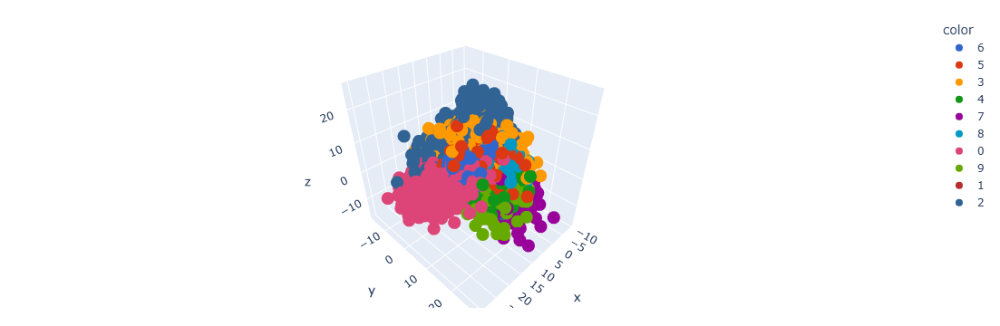

In [11]:
pca=PCA(n_components=3) #number of principal components
x_train_trf=pca.fit_transform(x_train)
x_test_trf=pca.transform(x_test)
    
knn=KNeighborsClassifier()
knn.fit(x_train_trf,y_train)
    
y_pred=knn.predict(x_test_trf)
print(accuracy_score(y_pred,y_test))

#3d visualization by plotly
import plotly.express as px
y_train_trf=y_train.astype(str)
fig= px.scatter_3d(x=x_train_trf[:,0],y=x_train_trf[:,1],z=x_train_trf[:,2],color=y_train_trf,color_discrete_sequence=px.colors.qualitative.G10)
fig.update_layout(margin=dict(l=20,r=20,t=20,b=20))
fig.show()